## Imports, etc.

In [3]:
import geopandas as gpd
import pandas as pd
import ee
import os
import geemap
import json
from sqlalchemy import create_engine
from dotenv import load_dotenv
from shapely.geometry import shape

load_dotenv(dotenv_path="./.env")

ee.Initialize()

DB_PASSWORD = os.environ.get('DB_PASSWORD')
DB_IP = os.environ.get('DB_IP')
engine = create_engine(f"mysql+mysqlconnector://root:{DB_PASSWORD}@{DB_IP}:3306/mai-database")

# Import
model_path = "../models/ConvNeXt_transfer/20250617_2101"
country_name = 'Yemen'
predictions = pd.read_csv(f'{model_path}/all_predictions_{country_name}.csv')
predictions = gpd.GeoDataFrame(predictions, geometry=gpd.GeoSeries.from_wkt(predictions['geometry'])).set_crs("EPSG:4326")
candidate_locs_folder = 'projects/afghanistan-candidate-locs/assets'
diffImg = ee.ImageCollection(f'{candidate_locs_folder}/diffImgAll_norm5k')


## Visualizing Basic Prediction Cells

In [3]:
# Import market shapes from the database
query = f"SELECT Location, maxSignal, mktShape FROM location_file WHERE country = '{country_name}' AND mktShape IS NOT NULL"
df = pd.read_sql(query, engine)

def extract_geometry_from_mktShape(mktShape):
    # Parse the mktShape string to dict if needed
    if isinstance(mktShape, str):
        mktShape = json.loads(mktShape)
    # Get the first weekday's geometry
    weekday = next(iter(mktShape.values()))
    # Use the first feature's geometry
    geom = weekday['features'][0]['geometry']
    return shape(geom)

df['geometry'] = df['mktShape'].apply(extract_geometry_from_mktShape)
markets = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')
markets_ee = geemap.geopandas_to_ee(markets)

In [4]:
import folium
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import json

# Reproject to EPSG:4326
gdf = predictions.to_crs(epsg=4326)

# Normalize prediction values and assign color
norm = mcolors.Normalize(vmin=gdf['prediction'].min(), vmax=gdf['prediction'].max())
cmap = plt.cm.viridis
gdf['color'] = gdf['prediction'].apply(lambda x: mcolors.to_hex(cmap(norm(x))))

# Create map centered on data
center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]
m = folium.Map(location=center, zoom_start=6, tiles=None)  # Disable default basemap

# Add Esri satellite tiles
folium.TileLayer(
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Esri',
    name='Esri Satellite',
    overlay=False,
    control=True
).add_to(m)

# Prepare GeoJSON with color property
geojson_data = json.loads(gdf.to_json())

# Style function uses per-feature color
def style_function(feature):
    return {
        'fillColor': feature['properties']['color'],
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0.5
    }

# Add prediction layer
folium.GeoJson(
    geojson_data,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(fields=['prediction'], aliases=['Prediction']),
    name='Predictions'
).add_to(m)

# Add market shapes to the map
folium.GeoJson(
    markets.geometry.__geo_interface__,
    style_function=lambda x: {'color': 'red', 'weight': 2, 'fillOpacity': 0.1},
    name='Market Shapes'
).add_to(m)

# Optional: Add color legend
import branca.colormap as cm
colormap = cm.LinearColormap(
    colors=[mcolors.to_hex(cmap(i)) for i in [0.0, 0.5, 1.0]],
    vmin=gdf['prediction'].min(),
    vmax=gdf['prediction'].max(),
    caption='Prediction'
)
colormap.add_to(m)

# Add layer control (optional if you add more layers)
folium.LayerControl().add_to(m)

# Display map
m


/var/folders/p2/p5d8wlsx6_ggsqbfcdsnn6880000gn/T/ipykernel_28891/3896483341.py:15: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = [gdf.geometry.centroid.y.mean(), gdf.geometry.centroid.x.mean()]


## Map Predictions to Generated Locations

In [18]:
# Import candidate locations from Earth Engine
candidate_locs = ee.FeatureCollection(f'projects/planetupload/assets/cleanedLocs/{country_name}/{country_name}')
candidate_locs_gdf = geemap.ee_to_gdf(candidate_locs)

In [19]:
# Get maxSignal and market information from the database
query = f"""
    SELECT
        lf.Location,
        lf.maxSignal,
        lf.market,
        lf.false_positive,
        lf.source,
        pr.minStrictnessRank,
        pr.runAnyway
    FROM
        location_file lf
    JOIN
        process_runs pr ON lf.Location = pr.Location
    WHERE lf.country="{country_name}"
        AND pr.Setup="MpM6"
        AND NOT minStrictnessRank IS NULL
    LIMIT 10000
"""
db_info = pd.read_sql(query, con=engine)

# Replace NaN with 0 in market and false_positive columns
db_info['market'] = db_info['market'].fillna(0)
db_info['false_positive'] = db_info['false_positive'].fillna(0)

# If runAnyways = yes, set market to 1
db_info.loc[db_info['runAnyway'] == 'yes', 'market'] = 1

# If false_positive = 1, set market to 0
db_info.loc[db_info['false_positive'] == 1, 'market'] = 0

# If minStrictnessRank < 21 and false_positive = 0 and runAnyways != 'yes', set market to 1
db_info.loc[(db_info['minStrictnessRank'] < 21) & (db_info['false_positive'] == 0) & (db_info['runAnyway'] != 'yes'), 'market'] = 1

db_info.head()

,Location,maxSignal,market,false_positive,source,minStrictnessRank,runAnyway
0,lon-12_1244lat12_6431,34.31,0.0,0.0,None,28,None
1,lon-12_4165lat14_7198,53.50,1.0,0.0,None,12,None
2,lon-12_6188lat14_9963,85.32,1.0,0.0,None,12,None
3,lon-12_8021lat12_6338,40.96,0.0,1.0,None,19,None
4,lon-12_9009lat15_0826,72.94,1.0,0.0,None,8,None


In [20]:
# Merge candidate_locs_gdf and db_info on mktID (from candidate_locs_gdf) and Location (from db_info)
candidate_locs_gdf = candidate_locs_gdf.merge(db_info, left_on='mktID', right_on='Location', how='inner', suffixes=('', '_db'))
candidate_locs_gdf[['mktID', 'maxSignal', 'maxSignal_db', 'market', 'source']].head()

,mktID,maxSignal,maxSignal_db,market,source
0,lon-15_7474lat14_3643,135.764596,135.76,1.0,None
1,lon-16_7916lat14_4358,126.895947,126.90,1.0,None
2,lon-16_29lat14_4625,123.458388,123.46,1.0,None
3,lon-13_5941lat15_9621,122.467923,122.47,1.0,None
4,lon-16_172lat15_2816,119.420579,119.42,1.0,None


In [21]:
def get_max_prediction_overlap(geom):
    overlapping = predictions[predictions.geometry.intersects(geom)]
    if not overlapping.empty:
        return overlapping['prediction'].max()
    else:
        return 0

def get_mean_prediction_overlap(geom):
    centroid = geom.centroid
    overlapping = predictions[predictions.geometry.intersects(centroid)]
    pred_values = list(overlapping['prediction'].values)
    if len(pred_values) > 1:
        return sum(pred_values) / len(pred_values)
    elif len(pred_values) == 1:
        return sum(pred_values) / 2
    else:
        return 0

# Calculate max and mean predictions for each candidate location
candidate_locs_gdf['max_prediction'] = candidate_locs_gdf['geometry'].apply(get_max_prediction_overlap)    
candidate_locs_gdf['mean_prediction'] = candidate_locs_gdf['geometry'].apply(get_mean_prediction_overlap)

### Visualize CNN Performance

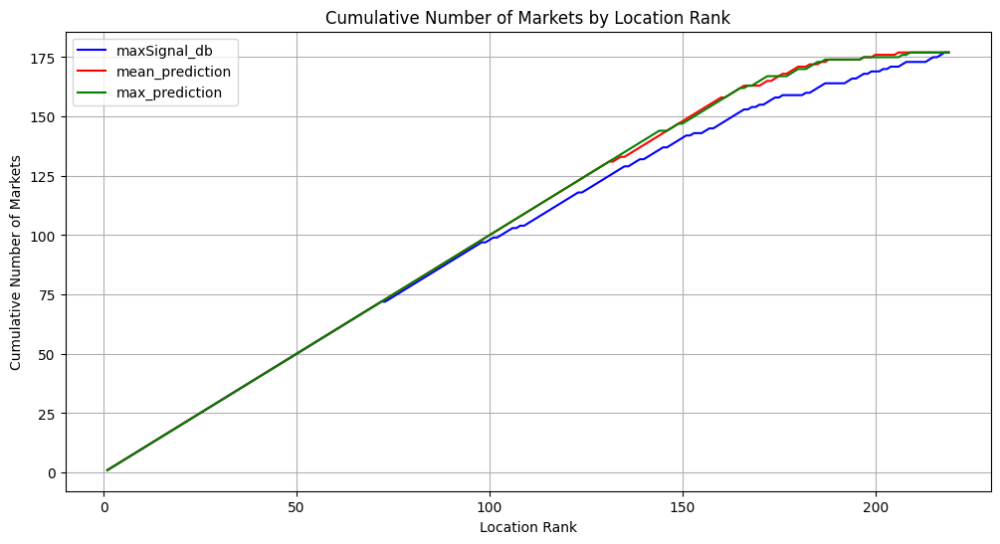

In [22]:
# Visualize cumulative number of markets by location rank
import matplotlib.pyplot as plt

pd.set_option('display.max_rows', None)
temp = candidate_locs_gdf.copy()
cols = ['maxSignal_db', 'mean_prediction', 'max_prediction']
labels = ['maxSignal_db', 'mean_prediction', 'max_prediction']
colors = ['blue', 'red', 'green']

plt.figure(figsize=(12, 6))
for col, label, color in zip(cols, labels, colors):
    t = temp[['mktID', col, 'market']].sort_values(by=col, ascending=False).copy()
    t['market'] = t['market'].fillna(0)
    t['cumulative_market'] = t['market'].cumsum()
    plt.plot(range(1, len(t) + 1), t['cumulative_market'], color=color, label=label)

plt.xlabel('Location Rank')
plt.ylabel('Cumulative Number of Markets')
plt.title('Cumulative Number of Markets by Location Rank')
plt.grid(True)
plt.legend()
plt.show()

In [23]:
candidate_locs_s2 = ee.FeatureCollection(f'{candidate_locs_folder}/allLocs_v20240812')
def set_mktID(f):
    coor = f.centroid(1).geometry().coordinates()
    lat = ee.String("lat").cat(ee.Number(coor.get(1)).multiply(10000).round().divide(10000).format())
    lon = ee.String("lon").cat(ee.Number(coor.get(0)).multiply(10000).round().divide(10000).format())
    mktIDstring = lon.cat(lat).replace('\\.', '_', 'g')
    return f.set({'mktID': mktIDstring, 'centroid': f.geometry().centroid()})

candidate_locs_s2 = candidate_locs_s2.map(set_mktID)

In [24]:
candidate_locs_s2_gdf = geemap.ee_to_gdf(candidate_locs_s2)

# Mark source column as "S2" in candidate_locs_gdf if Location in mktID column of candidate_locs_s2_gdf
candidate_locs_gdf.loc[
    candidate_locs_gdf['Location'].isin(candidate_locs_s2_gdf['mktID']),
    'source'
] = 'S2'

# Mark source as "hand-drawn" if source is NaN
candidate_locs_gdf['source'] = candidate_locs_gdf['source'].fillna('hand drawn')

KeyboardInterrupt: 

In [ ]:
candidate_locs_gdf.groupby('source').size().reset_index(name='count').sort_values(by='count', ascending=False)

In [ ]:
# Bar plot of market detection rate by decile of Sentinel-2 signal and source

import numpy as np
import matplotlib.pyplot as plt

maincolors = ['#2A9D8F', '#e9c46a', '#e76f51']

# Remove rows with missing values in 'maxSignal_db' or 'market'
df_plot = candidate_locs_gdf[['maxSignal_db', 'mean_prediction', 'market', 'source']].dropna()

# Compute decile bins for maxSignal_db
df_plot['decile'] = pd.qcut(df_plot['maxSignal_db'], 10, labels=False, duplicates='drop')

# Total number of observations
total_obs = len(df_plot)

# Group by decile and source, sum the number of markets
markets_by_decile_source = df_plot.groupby(['decile', 'source'])['market'].sum().unstack(fill_value=0)
total_by_decile = df_plot.groupby('decile').count()['market']
markets_by_decile_source = pd.merge(markets_by_decile_source, total_by_decile, left_index=True, right_index=True).rename(columns={'market': 'total'})

# Calculate within-decile percentage (relative to total observations)
percent_markets_source = markets_by_decile_source.div(markets_by_decile_source['total'], axis=0)

source_colors = {"S2": maincolors[0], "hand drawn": maincolors[2], "cnn_ConvNeXt_transfer": maincolors[1]}

# Plot
plt.figure(figsize=(8, 5))
bottom = np.zeros(len(percent_markets_source))
for source in ["S2", "hand drawn", "cnn_ConvNeXt_transfer"]:
    plt.bar(
        np.arange(1, len(percent_markets_source) + 1),
        percent_markets_source[source],
        bottom=bottom,
        color=source_colors[source],
        label=source
    )
    bottom += percent_markets_source[source].values

plt.xlabel('Decile of Sentinel-2 Signal')
plt.ylabel('Candidate Location True Positive Rate')
plt.title('Market Detection Rate by Sentinel-2 Signal Decile and Source')
plt.xticks(np.arange(1, len(percent_markets_source) + 1))
plt.legend(title="Source")
plt.grid(axis='y')
plt.show()


In [ ]:
# Bar plot of market detection rate by decile of CNN prediction value and source

import numpy as np
import matplotlib.pyplot as plt

maincolors = ['#2A9D8F', '#e9c46a', '#e76f51']

# Remove rows with missing values in 'maxSignal_db' or 'market'
df_plot = candidate_locs_gdf[['maxSignal_db', 'mean_prediction', 'market', 'source']].dropna()

# Compute decile bins for maxSignal_db
df_plot['decile'] = pd.qcut(df_plot['mean_prediction'], 10, labels=False, duplicates='drop')

# Total number of observations
total_obs = len(df_plot)

# Group by decile and source, sum the number of markets
markets_by_decile_source = df_plot.groupby(['decile', 'source'])['market'].sum().unstack(fill_value=0)
total_by_decile = df_plot.groupby('decile').count()['market']
markets_by_decile_source = pd.merge(markets_by_decile_source, total_by_decile, left_index=True, right_index=True).rename(columns={'market': 'total'})

# Calculate within-decile percentage (relative to total observations)
percent_markets_source = markets_by_decile_source.div(markets_by_decile_source['total'], axis=0)

source_colors = {"S2": maincolors[0], "hand drawn": maincolors[2], "cnn_ConvNeXt_transfer": maincolors[1]}

# Plot
plt.figure(figsize=(8, 5))
bottom = np.zeros(len(percent_markets_source))
for source in ["S2", "hand drawn", "cnn_ConvNeXt_transfer"]:
    plt.bar(
        np.arange(1, len(percent_markets_source) + 1),
        percent_markets_source[source],
        bottom=bottom,
        color=source_colors[source],
        label=source
    )
    bottom += percent_markets_source[source].values

plt.xlabel('Decile of CNN Prediction')
plt.ylabel('Candidate Location True Positive Rate')
plt.title('Market Detection Rate by CNN Prediction Decile and Source')
plt.xticks(np.arange(1, len(percent_markets_source) + 1))
plt.legend(title="Source")
plt.grid(axis='y')
plt.show()

In [ ]:
import numpy as np

import matplotlib.pyplot as plt

# Filter to only S2 source
df_plot_s2 = df_plot[df_plot['source'] == 'S2']

# Compute decile bins for maxSignal_db
df_plot_s2['decile'] = pd.qcut(df_plot_s2['maxSignal_db'], 10, labels=False, duplicates='drop')

# Group by decile, sum the number of markets
markets_by_decile_s2 = df_plot_s2.groupby('decile')['market'].sum()
total_by_decile_s2 = df_plot_s2.groupby('decile').count()['market']

# Calculate within-decile percentage (relative to total observations in each decile)
percent_markets_s2 = markets_by_decile_s2 / total_by_decile_s2

plt.figure(figsize=(8, 5))
plt.bar(
    np.arange(1, len(percent_markets_s2) + 1),
    percent_markets_s2,
    color=maincolors[0]
)

plt.xlabel('Decile of Sentinel-2 Signal')
plt.ylabel('Candidate Location True Positive Rate')
plt.title('Fraction of Markets by Sentinel-2 Signal Decile')
plt.xticks(np.arange(1, len(percent_markets_s2) + 1))
plt.grid(axis='y')
plt.show()

In [ ]:
import numpy as np

import matplotlib.pyplot as plt

# Filter to only S2 source
df_plot_s2 = df_plot[df_plot['source'] == 'hand-drawn']

# Compute decile bins for maxSignal_db
df_plot_s2['decile'] = pd.qcut(df_plot_s2['maxSignal_db'], 10, labels=False, duplicates='drop')

# Group by decile, sum the number of markets
markets_by_decile_s2 = df_plot_s2.groupby('decile')['market'].sum()
total_by_decile_s2 = df_plot_s2.groupby('decile').count()['market']

# Calculate within-decile percentage (relative to total observations in each decile)
percent_markets_s2 = markets_by_decile_s2 / total_by_decile_s2

plt.figure(figsize=(8, 5))
plt.bar(
    np.arange(1, len(percent_markets_s2) + 1),
    percent_markets_s2,
    color=maincolors[2]
)

plt.xlabel('Decile of Sentinel-2 Signal')
plt.ylabel('Candidate Location True Positive Rate')
plt.title('Fraction of Markets by Sentinel-2 Signal Decile')
plt.xticks(np.arange(1, len(percent_markets_s2) + 1))
plt.grid(axis='y')
plt.show()

## Generate New Candidate Locations

In [ ]:
import subprocess
import os
import json 
import ee
import geemap
import pandas as pd
import geopandas as gpd
from tqdm.notebook import tqdm
from sqlalchemy import create_engine
from shapely.geometry import shape

ee.Initialize()

DB_PASSWORD = os.environ.get('DB_PASSWORD')
DB_IP = os.environ.get('DB_IP')
engine = create_engine(f"mysql+mysqlconnector://root:{DB_PASSWORD}@{DB_IP}:3306/mai-database")

model_path = "/Users/pauldingus/Documents/MAI/mai_cnn/models/ConvNeXt_transfer/20250617_2101"
country_name = 'Afghanistan'
predictions = pd.read_csv(f'{model_path}/all_predictions_{country_name}.csv')
predictions = gpd.GeoDataFrame(predictions, geometry=gpd.GeoSeries.from_wkt(predictions['geometry'])).set_crs("EPSG:4326")


Successfully saved authorization token.


In [4]:
def get_candidate_loc_folders(country_names):
    """Get candidate location folders from GCP projects."""
    
    # Get the list of candidate loc projects from GCP
    command = '''gcloud projects list --filter="projectId ~ '.*-candidate-locs'"'''
    result = subprocess.run(command, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    
    if result.returncode != 0:
        return {}
    
    output = result.stdout.strip().split("\n")

    # Split each line into columns and create a list of dictionaries
    data = []
    for line in output[1:]:  # Skip the header row
        cols = line.split()
        if len(cols) >= 3:
            data.append({
                "PROJECT_ID": cols[0],
                "NAME": cols[1],
                "PROJECT_NUMBER": cols[2]
            })

    # Convert the data into a Pandas DataFrame
    candidate_loc_projects = pd.DataFrame(data)

    # Get a complete list of candidate loc folders
    all_folders = []
    for project_id in candidate_loc_projects['PROJECT_ID']:
        all_folders.append(f'projects/{project_id}/assets')
        try:
            assetList = ee.data.listAssets(f'projects/{project_id}/assets')
            folders = [a['id'] for a in assetList['assets'] if a['type'] == 'FOLDER']
            candidate_loc_folders = [f for f in folders if '-candidate-locs' in f.split('/')[-1]]
            all_folders = all_folders + candidate_loc_folders
        except Exception as e:
            print(f"Could not list assets for project {project_id}: {e}")

    # Create a lookup for candidate locs based on country names
    candidate_loc_lookup = {}
    for country in country_names:
        country_string = country.lower().replace(' ','')
        folder_string = country_string + '-candidate-locs'
        matching_folder = [f for f in all_folders if folder_string in f.split('/')[-2:]]
        
        # Special cases
        if country == 'Nigeria':
            matching_folder = ['projects/nigeria-candidate-locs/assets']
        elif country == 'Senegal':
            matching_folder = ['projects/sudan-candidate-locs/assets/senegal-candidate-locs']
        elif country == 'GuineaBissau':
            matching_folder = ['projects/ethiopia-candidate-locs/assets/guinea-bissau-candidate-locs']
        
        if matching_folder:
            candidate_loc_lookup[country] = matching_folder[0]
            print(f"Found candidate loc folder for {country}: {matching_folder[0]}")
        else:
            print(f'No candidate loc folder found for {country}')

    return candidate_loc_lookup

candidate_loc_folder_lookup = get_candidate_loc_folders([country_name])
candidate_locs_folder = candidate_loc_folder_lookup.get(country_name)
diffImg = ee.ImageCollection(f'{candidate_locs_folder}/diffImgAll_norm5k')
candidate_locs = ee.FeatureCollection(f'projects/planetupload/assets/cleanedLocs/{country_name}/{country_name}')
candidate_locs_gdf = geemap.ee_to_gdf(candidate_locs)

Found candidate loc folder for Afghanistan: projects/togo-candidate-locs/assets/afghanistan-candidate-locs


### Step 1: Creating a small grid of predictions

In [5]:
gdf = predictions.copy()
gdf_non_overlapping = gdf[~gdf.geometry.apply(lambda x: candidate_locs_gdf.geometry.intersects(x).any())]
gdf_non_overlapping = gdf_non_overlapping.reset_index(drop=True)
gdf_non_overlapping["uid"] = gdf_non_overlapping.index

# Create atomic (non-overlapping) polygons from all boundaries
atoms = gdf_non_overlapping.overlay(gdf_non_overlapping, how='union')

# Throw out where uid_1 = uid_2 (i.e. self-intersections)
atoms = atoms[atoms['uid_1'] != atoms['uid_2']]

# Throw out polygons where set(uid_1, uid_2) is the same
atoms['uid_set'] = atoms.apply(lambda row: frozenset([row['uid_1'], row['uid_2']]), axis=1)
atoms = atoms.drop_duplicates(subset=['uid_set'])
atoms = atoms.drop(columns=['uid_set'])

#Throw out where area > 0.00005
atoms = atoms[atoms.geometry.area < 0.00005]

# Get the average prediction value for each atomic polygon
atoms['mean_prediction'] = (atoms['prediction_1'] + atoms['prediction_2'])/2

# Filter to get only very high prediction values
high_prediction_atoms = atoms[atoms['mean_prediction'] > 0.7].sort_values(by='mean_prediction', ascending=False)
high_prediction_atoms_ee = geemap.gdf_to_ee(high_prediction_atoms)

/Users/pauldingus/Documents/MAI/mai_cnn/.venv/lib/python3.8/site-packages/geopandas/geodataframe.py:2451: UserWarning: `keep_geom_type=True` in overlay resulted in 42658 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  return geopandas.overlay(
/var/folders/p2/p5d8wlsx6_ggsqbfcdsnn6880000gn/T/ipykernel_83931/1114995104.py:18: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  atoms = atoms[atoms.geometry.area < 0.00005]


In [ ]:
# NIGERIA ONLY!!!
from shapely.geometry import Polygon

# Limit to features north of 8 degrees latitude
high_prediction_atoms = high_prediction_atoms[high_prediction_atoms.geometry.apply(
    lambda geom: isinstance(geom, Polygon) and all([y > 8 for x, y in geom.exterior.coords])
)]
high_prediction_atoms = high_prediction_atoms.sort_values(by='mean_prediction', ascending=False).head(400)
high_prediction_atoms_ee = geemap.gdf_to_ee(high_prediction_atoms)

In [30]:
print(f'Number of high-prediction cells: {len(high_prediction_atoms)}')
high_prediction_atoms.explore('mean_prediction')

Number of high-prediction cells: 351


In [7]:
# Import market shapes from the database
query = f"SELECT Location, maxSignal, mktShape FROM location_file WHERE country = '{country_name}' AND mktShape IS NOT NULL"
df = pd.read_sql(query, engine)

def extract_geometry_from_mktShape(mktShape):
    # Parse the mktShape string to dict if needed
    if isinstance(mktShape, str):
        mktShape = json.loads(mktShape)
    # Get the first weekday's geometry
    weekday = next(iter(mktShape.values()))
    # Use the first feature's geometry
    geom = weekday['features'][0]['geometry']
    return shape(geom)

df['geometry'] = df['mktShape'].apply(extract_geometry_from_mktShape)
markets = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')
markets_ee = geemap.geopandas_to_ee(markets)

In [11]:
diffImg = ee.ImageCollection(f'{candidate_locs_folder}/diffImgAll_norm5k')

# Define visualization parameters for a continuous palette
vis_params = {
    'min': 0,
    'max': 1,
    'palette': ['#440154', '#21908d', '#fde725']
}

# Convert FeatureCollection to an image (necessary for coloring polygons)
image_preds = high_prediction_atoms_ee.reduceToImage(properties=['mean_prediction'], reducer=ee.Reducer.first())

# Create an interactive map
Map = geemap.Map(basemap='SATELLITE')
Map.addLayer(diffImg, {"max": 7}, 'Diff Image')
Map.addLayer(image_preds, vis_params, 'Prediction')
Map.addLayer(markets_ee, {'color': 'red', 'fillColor': 'red', 'fillOpacity': 0.5}, 'Markets')
Map.center_object(diffImg, 12)
Map.add_colorbar(vis_params, label='Prediction value')
Map

Map(center=[34.09606679847554, 66.11556652897883], controls=(WidgetControl(options=['position', 'transparent_b…

### Step 2: Convert High-prediction Atoms into Candidate Locationa

In [8]:
# Initialize a new column for candidate locations
high_prediction_atoms['candidate_location'] = None
high_prediction_atoms['skip'] = None

# Initialize a feature collection to store candidate locations
candidate_locations_ee = ee.FeatureCollection([])

In [9]:

for atom in tqdm(high_prediction_atoms.geometry, desc="Processing atoms"):

    # If candidate location already exists, skip this atom
    if not high_prediction_atoms.loc[high_prediction_atoms.geometry.apply(lambda g: g.equals(atom)), "candidate_location"].isnull().all():
        print('already done')
        continue

    # If candidate_location not None, skip, or if skip = True, skip
    if (high_prediction_atoms.loc[high_prediction_atoms.geometry.apply(lambda g: g.equals(atom)), "skip"] == 'yes').any():
        print('skipping due to overlapping geometry')
        continue

    try:
        # Get the geojson geometry of the atom
        atom_geojson = atom.__geo_interface__
        atom_ee = ee.Geometry(atom_geojson)

        # Get the max pixel value for the atom
        diffImg_cell = diffImg.filterBounds(atom_ee).reduce(ee.Reducer.mean()).clip(atom_ee)
        max = diffImg_cell.reduceRegion(
            reducer=ee.Reducer.max(),
            geometry=atom_ee,
            scale=10,
            maxPixels=1e9
        ).get('max_all_norm_mean')
        max = ee.Number(max)
        print(f'Max value for atom: {max.getInfo()}. Generating candidate location...')

        # Get a feature collection of a single feature with the high signal area
        cutoff = max.multiply(ee.Number(0.5))
        cutoffMask = diffImg_cell.gt(cutoff).selfMask().rename('high_signal')
        objectId = cutoffMask.connectedComponents(connectedness = ee.Kernel.circle(35, 'meters'), maxSize = 128)
        iNormalized = objectId.select('labels').addBands(diffImg_cell)
        maxSignalFC = iNormalized.reduceToVectors(
            reducer=ee.Reducer.max(),
            geometry=atom_ee,
            scale=10,
            labelProperty='labels',
            eightConnected=True,
            crs= iNormalized.projection(),
            maxPixels=1e13
        ).filter(ee.Filter.eq('max', max))

        # Create a buffer around the max signal feature
        loc = maxSignalFC.geometry().buffer(250).simplify(10)

        # Add loc to the feature collection of candidate locations
        candidate_locations_ee = candidate_locations_ee.merge(ee.FeatureCollection([ee.Feature(loc)]))

        # Convert the Earth Engine geometry to GeoJSON, then to shapely geometry
        loc_geojson = loc.getInfo()
        loc_shape = shape(loc_geojson)

        # Add the loc geometry to a new column "candidate location" for this atom
        mask_atom = high_prediction_atoms.geometry.apply(lambda g: g.equals(atom))
        high_prediction_atoms.loc[mask_atom, "candidate_location"] = loc_shape

        # Filter out all other rows that intersect with this candidate location
        mask = high_prediction_atoms.geometry.apply(lambda g: not (g != atom and g.intersects(loc_shape)))
        print(f"Filtered {high_prediction_atoms[~mask].shape[0]} rows that intersect with the candidate location.")
        high_prediction_atoms.loc[~mask, 'skip'] = 'yes'

    except Exception as e:
        print(f"Error processing atom {atom}: {e}")
        continue

Processing atoms:   0%|          | 0/118 [00:00<?, ?it/s]

Max value for atom: 58.30870138174273. Generating candidate location...
Filtered 1 rows that intersect with the candidate location.
already done
already done
already done
Max value for atom: 19.841962318046146. Generating candidate location...
Filtered 3 rows that intersect with the candidate location.
Max value for atom: 25.37142208777854. Generating candidate location...
Filtered 1 rows that intersect with the candidate location.
Max value for atom: 25.845924782070597. Generating candidate location...
Filtered 0 rows that intersect with the candidate location.
Max value for atom: 5.4066139647139195. Generating candidate location...
Filtered 1 rows that intersect with the candidate location.
Max value for atom: 55.20586915329133. Generating candidate location...
Filtered 0 rows that intersect with the candidate location.
Max value for atom: 14.07251561696715. Generating candidate location...
Filtered 1 rows that intersect with the candidate location.
Max value for atom: 23.97331798629

KeyboardInterrupt: 

### Step 3: Export to local and Earth Engine

In [36]:
from shapely.geometry.base import BaseGeometry

# Drop candidate location where skip = 'yes'
high_prediction_atoms = high_prediction_atoms[high_prediction_atoms['skip'] != 'yes']

# Format the candidate locations GeoDataFrame
candidate_locations = high_prediction_atoms.drop(columns=['max_1', 'diffImg_name_1', 'uid_1', 'uid_2', 'geometry']).rename(columns={'max_2': 'maxSignal', 'diffImg_name_2': 'cell', 'candidate_location': 'geometry'})
candidate_locations = candidate_locations.set_geometry('geometry').set_crs("EPSG:4326")

# Clean up the candidate locations feature collection
candidate_locations_clean = candidate_locations[
    candidate_locations['geometry'].notnull() &
    candidate_locations['geometry'].apply(lambda g: isinstance(g, BaseGeometry) and g.is_valid and not g.is_empty)
]
print(f"Rows after cleaning: {len(candidate_locations_clean)}")

# Save the candidate locations to a GeoJSON file
candidate_locations_clean.to_file(f'{model_path}/additional_candidate_locations_{country_name}.geojson', driver='GeoJSON')
candidate_locations_clean.head()

Rows after cleaning: 289


,prediction_1,maxSignal,prediction_2,cell,mean_prediction,geometry,skip
138718,0.990072,21.369842,0.960178,cell_395,0.975125,"POLYGON ((6.49392 13.08306, 6.49439 13.08308, ...",None
102405,0.979023,15.138939,0.968961,cell_316,0.973992,"POLYGON ((3.93384 11.69858, 3.93463 11.69867, ...",None
20703,0.958186,22.346334,0.972226,cell_137,0.965206,"POLYGON ((7.80366 8.30714, 7.80346 8.30582, 7....",None
134151,0.950888,14.052988,0.971492,cell_39,0.961190,"POLYGON ((7.81507 5.87292, 7.81417 5.87273, 7....",None
83709,0.963786,16.421809,0.950363,cell_274,0.957074,"POLYGON ((8.05403 10.98433, 8.05311 10.98415, ...",None


In [37]:
candidate_locations_clean.explore('mean_prediction')

In [38]:
ee.Initialize()

candidate_locations_ee = geemap.gdf_to_ee(candidate_locations_clean)

# Export the candidate locations to earth engine
task = ee.batch.Export.table.toAsset(
    collection=candidate_locations_ee,
    description=f'cnn_candidate_locations_{country_name}',
    assetId=f'{candidate_locs_folder}/additionalLocs_{model_path.split("/")[-2]}_{model_path.split("/")[-1]}',
)
task.start()

In [ ]:
f'{candidate_locs_folder}/additionalLocs_{model_path.split("/")[-2]}_{model_path.split("/")[-1]}'

'projects/nigeria-candidate-locs/assets/additionalLocs_ConvNeXt_transfer_20250617_2101'

In [19]:
# List active earthengine tasks
tasks = ee.batch.Task.list()

# Find the task we just created
for task in tasks:
    if task.config.get('description') == f'cnn_candidate_locations_{country_name}':
        print(f"Found task: {task.id}")
        break

# Check the status of the task
print(f"Task status: {task.status()['state']}")

Found task: W74ULU3EQ72TNEPJRTAXMCCG
Task status: RUNNING


In [21]:
Map = geemap.Map(basemap='SATELLITE')
Map.addLayer(diffImg, {"max": 7}, 'Diff Image')
Map.addLayer(candidate_locations_ee, {'color': 'blue', 'fillColor': 'blue', 'fillOpacity': 0.5}, 'Candidate Locations')
Map.addLayer(markets_ee, {'color': 'red', 'fillColor': 'red', 'fillOpacity': 0.5}, 'Markets')
Map.center_object(diffImg, 12)
Map

Map(center=[14.341187983122461, -14.512238822882233], controls=(WidgetControl(options=['position', 'transparen…

{'type': 'Feature', 'geometry': {'type': 'Polygon', 'coordinates': [[[69.17706332321943, 34.52306298160612], [69.17706305037386, 34.523059618312736], [69.17704013134622, 34.51223792705102], [69.17705340983053, 34.51222540663047], [69.17706468744724, 34.512211722335906], [69.17707005341002, 34.512210896205616], [69.19017876526561, 34.51219114483975], [69.19019395352383, 34.512202087949916], [69.1902105969443, 34.51221142938229], [69.19021132452552, 34.51221471218437], [69.19021159736847, 34.512218076027146], [69.19023624418202, 34.52303980419047], [69.19022296582497, 34.52305232498603], [69.19021159736847, 34.523065993257084], [69.19020623145697, 34.52306690065683], [69.17709588278979, 34.52308663150838], [69.17708069438694, 34.52307560674532], [69.1770640508076, 34.523066344805386], [69.17706332321943, 34.52306298160612]]]}, 'properties': {'centroid': {'type': 'Point', 'coordinates': [69.18363775822125, 34.51763906932261]}, 'mktID': 'lon69_1836lat34_5176'}}
lon69_1836lat34_5176


## Upload Candidate Loc Prediction Values to Existing Locs in DB

In [ ]:
cnn_locs = ee.FeatureCollection('projects/planetupload/assets/cleanedLocs/Ethiopia/Ethiopia_20250604')
cnn_locs_gdf = geemap.ee_to_gdf(cnn_locs)

In [ ]:
cnn_locs_gdf.head()

In [ ]:
from sqlalchemy import text

def execute_query(query, params=None):
    with engine.begin() as connection:  # <-- begin() auto-commits on exit
        result = connection.execute(text(query), params or {})
        if result.returns_rows:
            return result.fetchall()
        return result.rowcount


In [ ]:
# Update the database with the maxSignal for each candidate location
for index, row in cnn_locs_gdf.iterrows():
    mktID = row['mktID']
    maxSignal = round(row['maxSignal'], 2)
    
    # Update the maxSignal in the database
    query = "UPDATE location_file SET maxSignal = :maxSignal WHERE Location = :mktID"
    params = {'maxSignal': maxSignal, 'mktID': mktID}
    
    try:
        execute_query(query, params)
        print(f"Updated {mktID} with maxSignal {maxSignal}")
    except Exception as e:
        print(f"Error updating {mktID}: {e}")

In [ ]:
# Update the database with the mean predictions for each candidate location
for index, row in candidate_locs_gdf.iterrows():
    loc = row['mktID']
    mean_prediction = row['mean_prediction']
    update_query = '''
        UPDATE `mai-database`.`location_file`
        SET mktProbability = :mean_prediction
        WHERE Location = :loc
    '''
    print(f'Updating {loc} with mean prediction {mean_prediction}')
    execute_query(update_query, {'mean_prediction': mean_prediction, 'loc': loc})